In [1]:
import torch 
import torchvision
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
import numpy as np

In [2]:
class Discriminator(nn.Module):
  def __init__(self,channels_img,features_d,**kwargs):
    super(Discriminator,self).__init__(**kwargs)
    self.net=nn.Sequential(
        nn.Conv2d(channels_img,features_d,kernel_size=4,stride=2,padding=1),
        nn.LeakyReLU(0.2),
        nn.Conv2d(features_d,features_d*2,kernel_size=4,stride=2,padding=1),
        nn.BatchNorm2d(features_d*2),
        nn.LeakyReLU(0.2),
        nn.Conv2d(features_d*2,features_d*4,kernel_size=4,stride=2,padding=1),
        nn.BatchNorm2d(features_d*4),
        nn.LeakyReLU(0.2),
        nn.Conv2d(features_d*4,features_d*8,kernel_size=4,stride=2,padding=1),
        nn.BatchNorm2d(features_d*8),
        nn.LeakyReLU(0.2),
        nn.Conv2d(features_d*8,1,kernel_size=4,stride=2,padding=0),
        nn.Sigmoid()
    )

  def forward(self,x):
    return self.net(x)

In [3]:
class Generator(nn.Module):
  def __init__(self,channels_noise,channels_img,features_g):
    super(Generator,self).__init__()
    self.net=nn.Sequential(
        nn.ConvTranspose2d(channel_noise,features_g*16,kernel_size=4,stride=1,padding=0),
        nn.BatchNorm2d(features_g*16),
        nn.ReLU(True),
        nn.ConvTranspose2d(features_g*16,features_g*8,kernel_size=4,stride=2,padding=1),
        nn.BatchNorm2d(features_g*8),
        nn.ReLU(True),
        nn.ConvTranspose2d(features_g*8,features_g*4,kernel_size=4,stride=2,padding=1),
        nn.BatchNorm2d(features_g*4),
        nn.ReLU(True),
        nn.ConvTranspose2d(features_g*4,features_g*2,kernel_size=4,stride=2,padding=1),
        nn.BatchNorm2d(features_g*2),
        nn.ReLU(True),
        nn.ConvTranspose2d(features_g*2,channels_img,kernel_size=4,stride=2,padding=1),
        nn.Tanh()
    )

  def forward(self,x):
    return self.net(x)

In [4]:
lr=0.0002
batch_size=64
image_size=64
channels_img=1
channel_noise=256
num_epochs=10

features_d=16
features_g=16
# print(features_g*8)
my_transform=transforms.Compose([
  transforms.Resize(image_size),
  transforms.ToTensor(),
  transforms.Normalize((0.5,),(0.5,)),
  ])

dataset=datasets.MNIST(root='dataset/',train=True,transform=my_transform,download=True)
print(dataset)
dataloader=DataLoader(dataset,batch_size=batch_size,shuffle=True)

Extracting dataset/MNIST/raw/train-images-idx3-ubyte.gz to dataset/MNIST/raw


Extracting dataset/MNIST/raw/train-labels-idx1-ubyte.gz to dataset/MNIST/raw


Extracting dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to dataset/MNIST/raw




Extracting dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to dataset/MNIST/raw
Processing...
Done!
Dataset MNIST
    Number of datapoints: 60000
    Root location: dataset/
    Split: Train
    StandardTransform
Transform: Compose(
               Resize(size=64, interpolation=PIL.Image.BILINEAR)
               ToTensor()
               Normalize(mean=(0.5,), std=(0.5,))
           )


/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:469: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [5]:
def imshow(img):
  img=img/2+0.5
  img=img.cpu()
  npimg=img.numpy()
  plt.imshow(np.transpose(npimg,(1,2,0)))
  plt.show()

Training
epoch [0/10]  batch 0/938\  loss D : 1.4364,   loss G: 0.8715    D(x): 0.4967


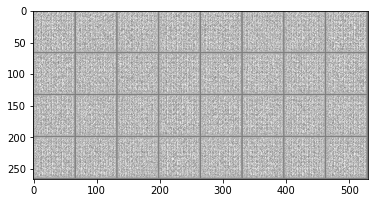

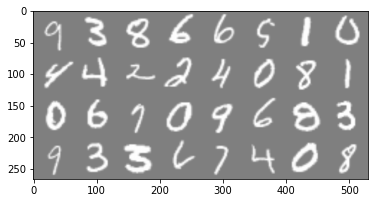

epoch [0/10]  batch 100/938\  loss D : 0.6636,   loss G: 3.1287    D(x): 0.8974


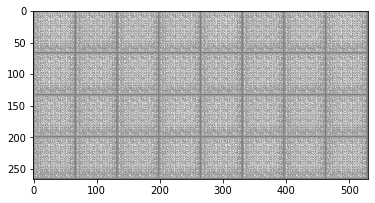

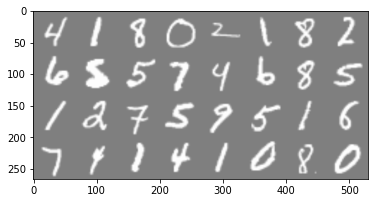

epoch [0/10]  batch 200/938\  loss D : 0.6747,   loss G: 3.5695    D(x): 0.9100


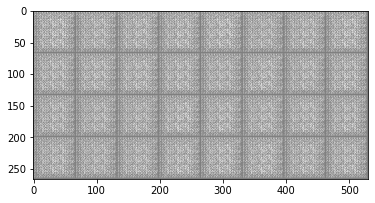

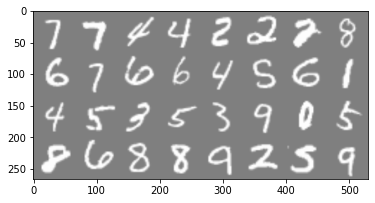

epoch [0/10]  batch 300/938\  loss D : 0.7072,   loss G: 3.3154    D(x): 0.8711


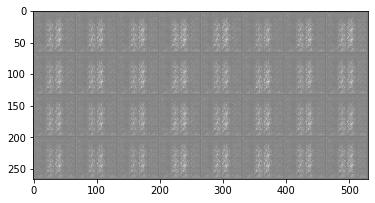

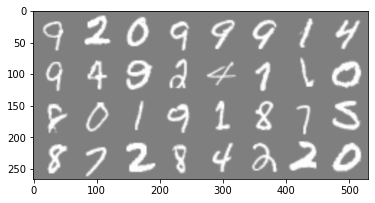

epoch [0/10]  batch 400/938\  loss D : 0.7158,   loss G: 2.4487    D(x): 0.8222


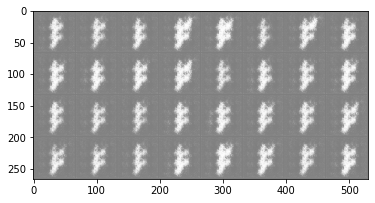

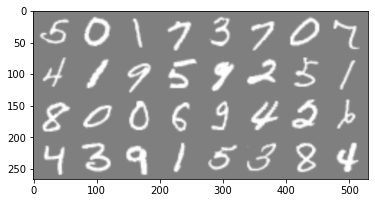

epoch [0/10]  batch 500/938\  loss D : 0.6817,   loss G: 3.1610    D(x): 0.8566


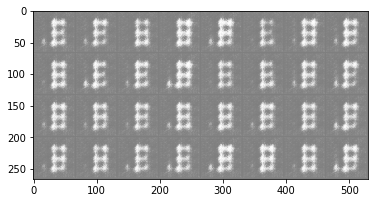

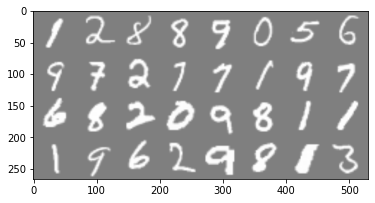

epoch [0/10]  batch 600/938\  loss D : 1.0105,   loss G: 2.5614    D(x): 0.7568


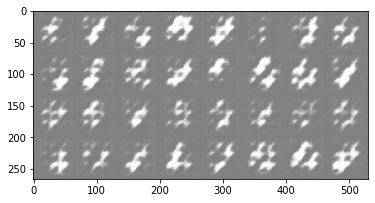

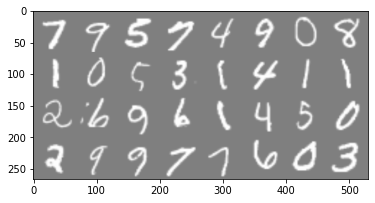

epoch [0/10]  batch 700/938\  loss D : 0.8725,   loss G: 2.6125    D(x): 0.8207


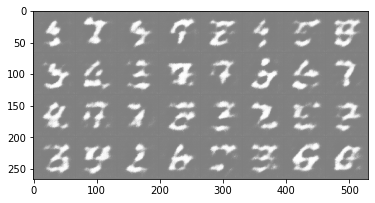

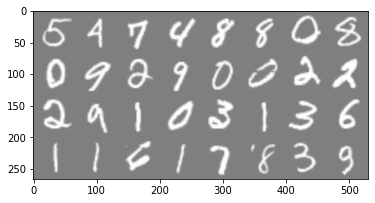

epoch [0/10]  batch 800/938\  loss D : 0.8280,   loss G: 1.2581    D(x): 0.6752


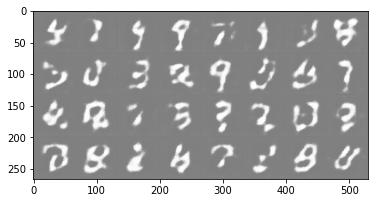

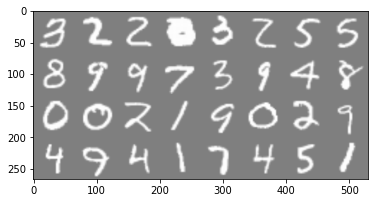

epoch [0/10]  batch 900/938\  loss D : 0.7887,   loss G: 2.3180    D(x): 0.8500


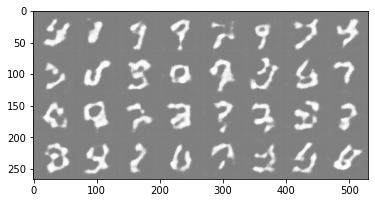

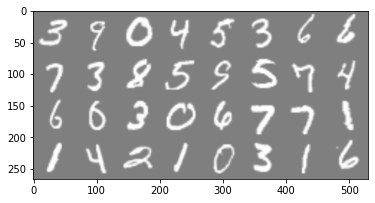

epoch [1/10]  batch 0/938\  loss D : 0.8242,   loss G: 1.4290    D(x): 0.7276


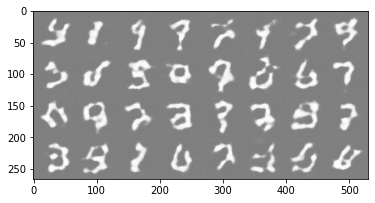

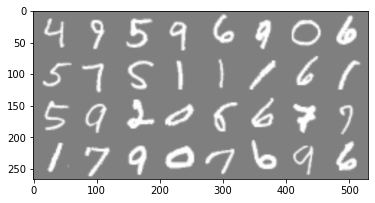

epoch [1/10]  batch 100/938\  loss D : 0.8301,   loss G: 1.3598    D(x): 0.7302


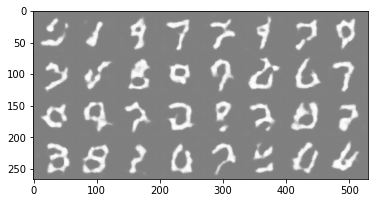

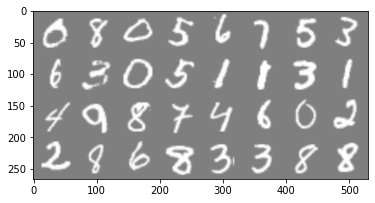

epoch [1/10]  batch 200/938\  loss D : 0.8235,   loss G: 1.1119    D(x): 0.6822


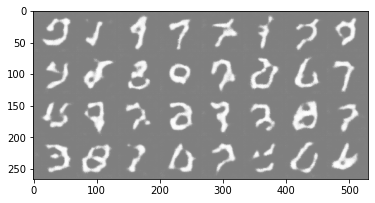

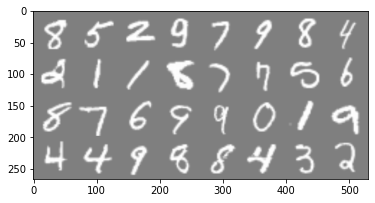

epoch [1/10]  batch 300/938\  loss D : 0.9511,   loss G: 1.3012    D(x): 0.6637


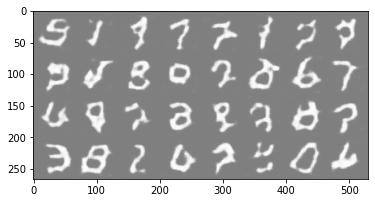

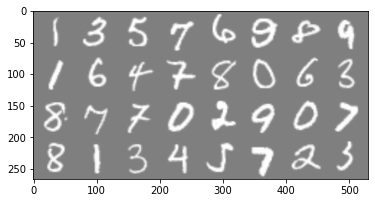

epoch [1/10]  batch 400/938\  loss D : 0.8305,   loss G: 1.8019    D(x): 0.7902


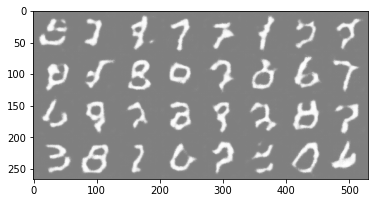

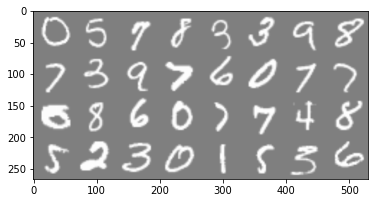

epoch [1/10]  batch 500/938\  loss D : 0.9141,   loss G: 1.2222    D(x): 0.6705


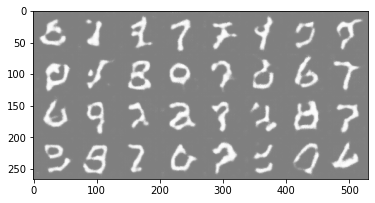

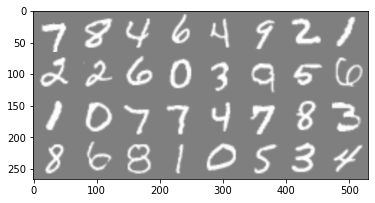

epoch [1/10]  batch 600/938\  loss D : 0.9022,   loss G: 1.6709    D(x): 0.6101


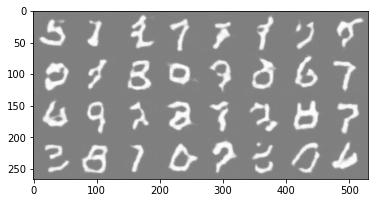

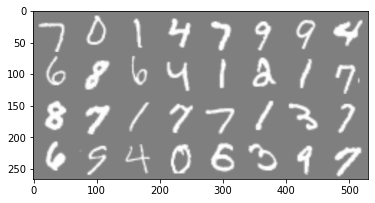

epoch [1/10]  batch 700/938\  loss D : 0.7841,   loss G: 2.1768    D(x): 0.7989


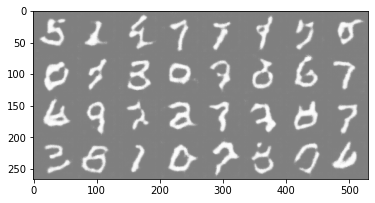

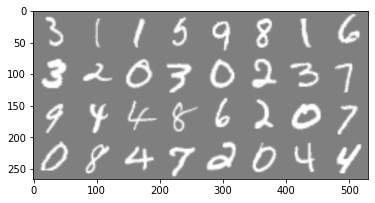

epoch [1/10]  batch 800/938\  loss D : 0.9587,   loss G: 1.2262    D(x): 0.7877


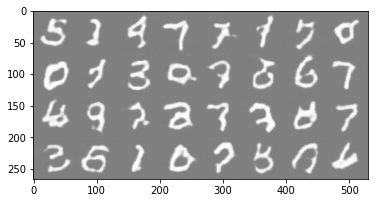

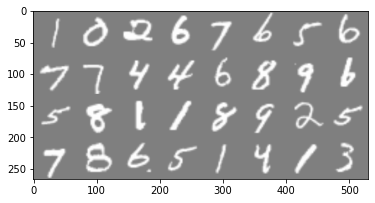

epoch [1/10]  batch 900/938\  loss D : 0.7475,   loss G: 2.0677    D(x): 0.8228


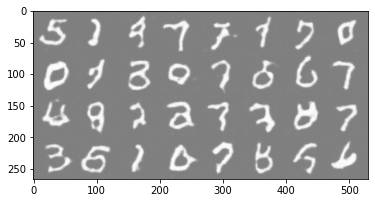

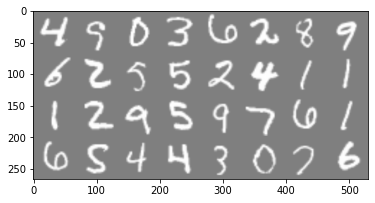

epoch [2/10]  batch 0/938\  loss D : 1.0001,   loss G: 2.1226    D(x): 0.9079


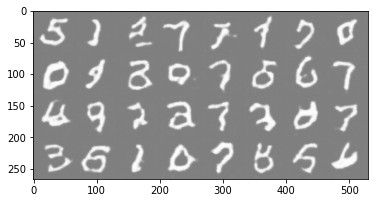

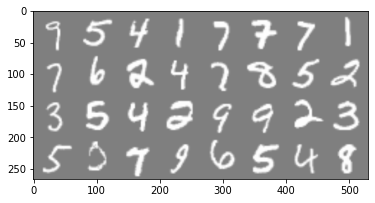

epoch [2/10]  batch 100/938\  loss D : 0.8934,   loss G: 1.4338    D(x): 0.6209


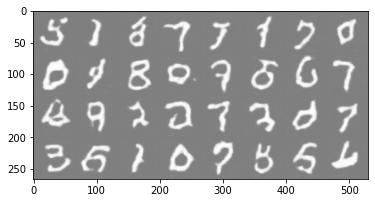

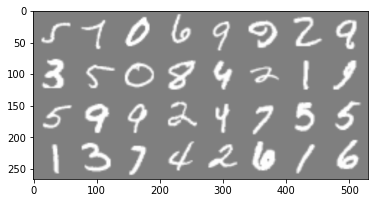

epoch [2/10]  batch 200/938\  loss D : 0.6990,   loss G: 2.0550    D(x): 0.8499


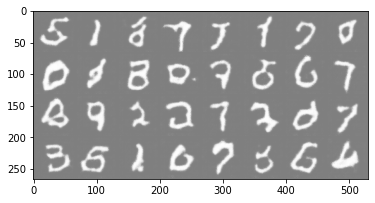

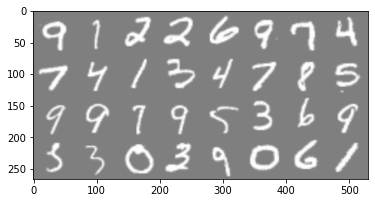

epoch [2/10]  batch 300/938\  loss D : 0.8223,   loss G: 2.2305    D(x): 0.8542


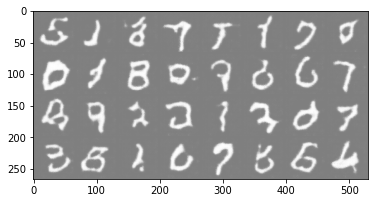

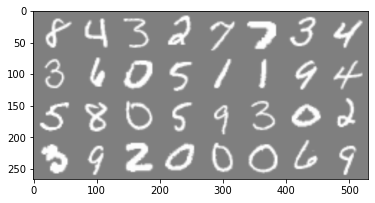

epoch [2/10]  batch 400/938\  loss D : 0.7761,   loss G: 1.5292    D(x): 0.7643


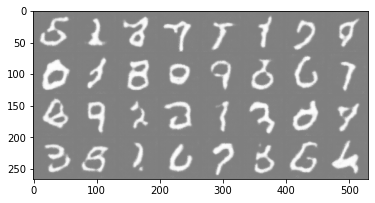

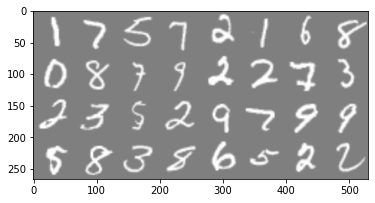

epoch [2/10]  batch 500/938\  loss D : 1.6242,   loss G: 1.0895    D(x): 0.2928


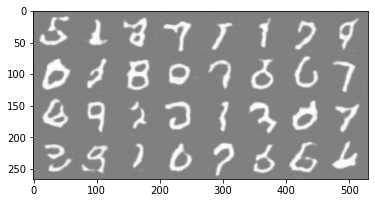

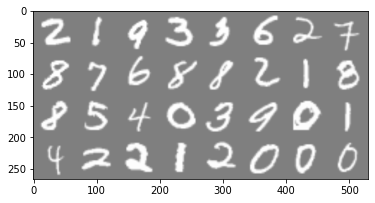

epoch [2/10]  batch 600/938\  loss D : 0.7708,   loss G: 1.9362    D(x): 0.7915


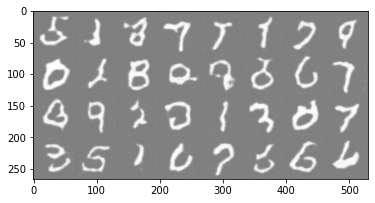

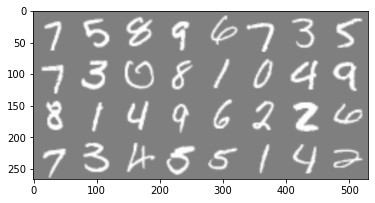

epoch [2/10]  batch 700/938\  loss D : 0.7814,   loss G: 1.8287    D(x): 0.7872


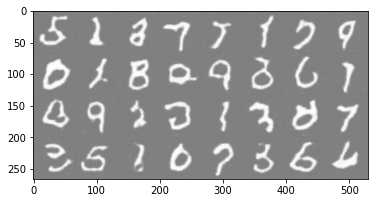

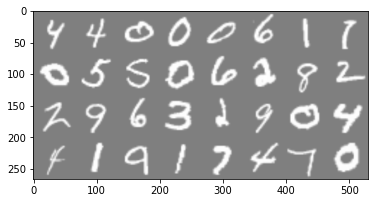

epoch [2/10]  batch 800/938\  loss D : 0.7650,   loss G: 2.0452    D(x): 0.8464


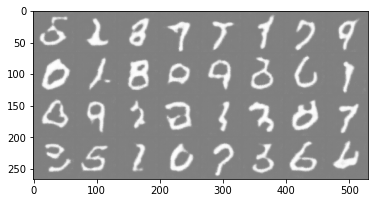

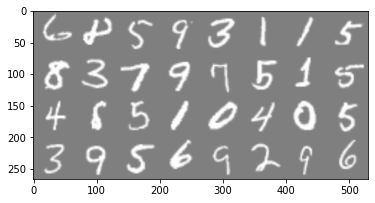

epoch [2/10]  batch 900/938\  loss D : 0.8170,   loss G: 1.1678    D(x): 0.7193


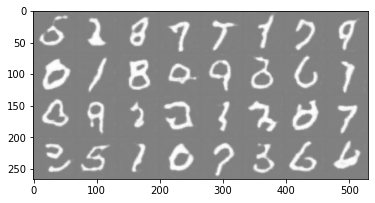

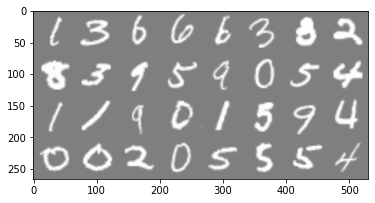

epoch [3/10]  batch 0/938\  loss D : 0.8274,   loss G: 1.4641    D(x): 0.6842


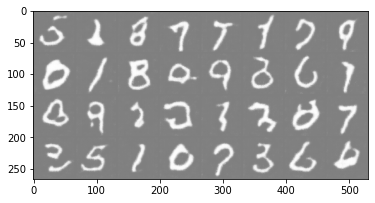

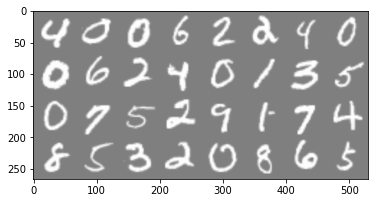

epoch [3/10]  batch 100/938\  loss D : 0.7829,   loss G: 1.6694    D(x): 0.7242


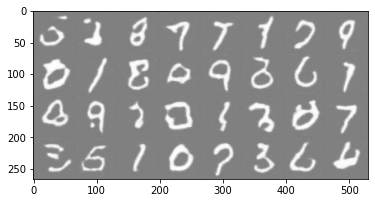

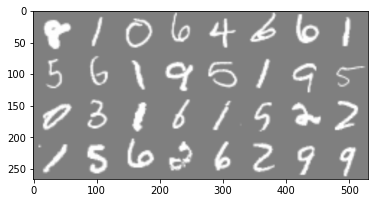

epoch [3/10]  batch 200/938\  loss D : 0.7418,   loss G: 2.0453    D(x): 0.8930


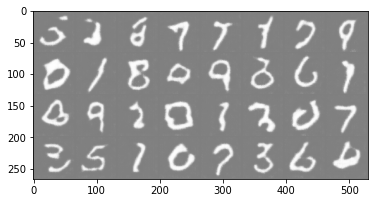

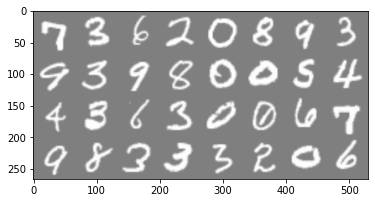

epoch [3/10]  batch 300/938\  loss D : 0.8578,   loss G: 1.2851    D(x): 0.6609


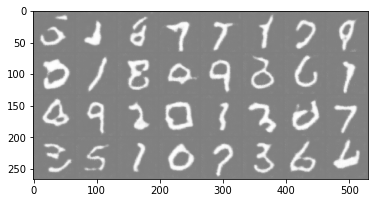

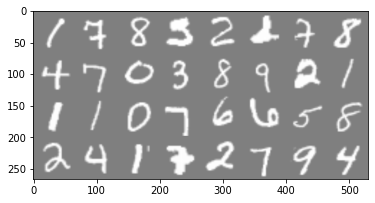

epoch [3/10]  batch 400/938\  loss D : 1.0996,   loss G: 0.8601    D(x): 0.4822


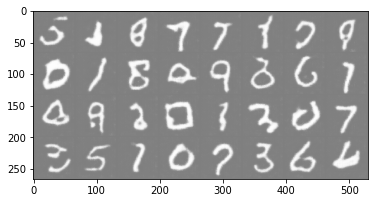

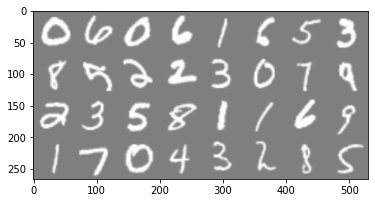

epoch [3/10]  batch 500/938\  loss D : 0.7691,   loss G: 1.9028    D(x): 0.8234


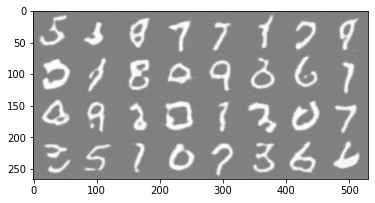

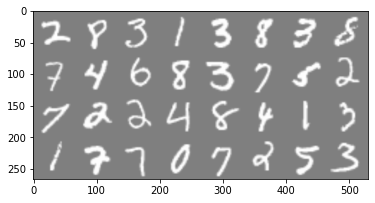

epoch [3/10]  batch 600/938\  loss D : 0.7803,   loss G: 1.4150    D(x): 0.7366


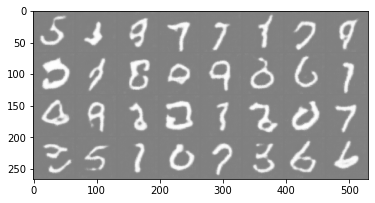

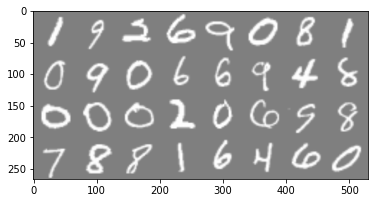

epoch [3/10]  batch 700/938\  loss D : 0.7560,   loss G: 1.8769    D(x): 0.8701


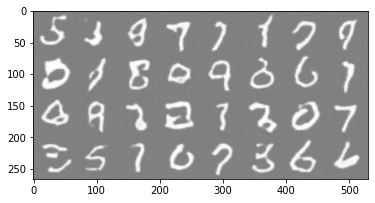

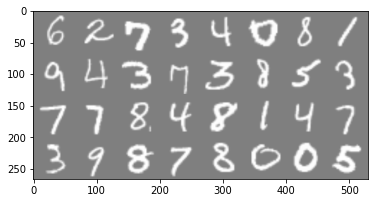

epoch [3/10]  batch 800/938\  loss D : 0.7942,   loss G: 1.4504    D(x): 0.7285


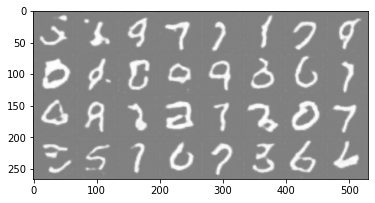

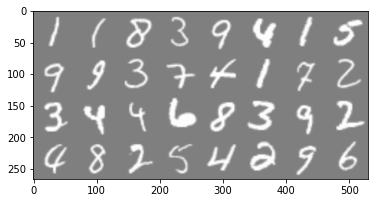

epoch [3/10]  batch 900/938\  loss D : 0.7565,   loss G: 2.1307    D(x): 0.8180


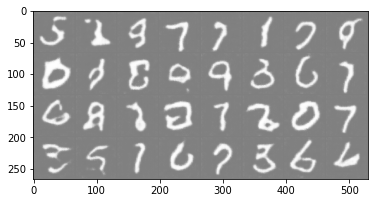

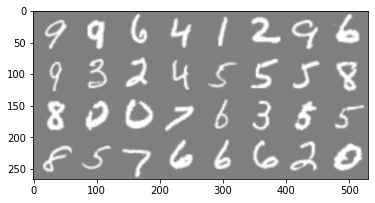

epoch [4/10]  batch 0/938\  loss D : 0.7701,   loss G: 1.8838    D(x): 0.8429


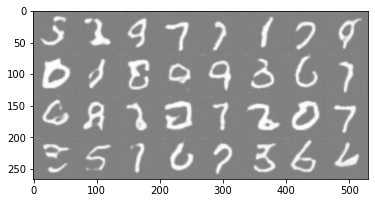

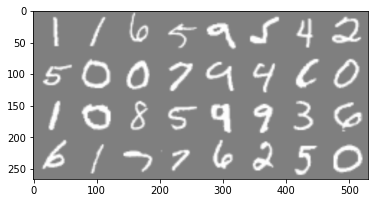

epoch [4/10]  batch 100/938\  loss D : 0.9166,   loss G: 1.5473    D(x): 0.6081


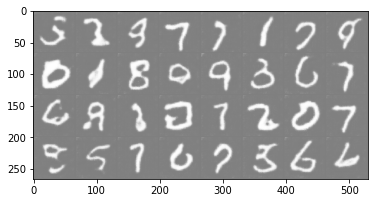

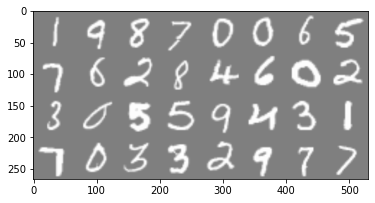

epoch [4/10]  batch 200/938\  loss D : 1.0413,   loss G: 1.1258    D(x): 0.5404


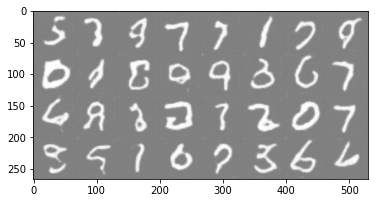

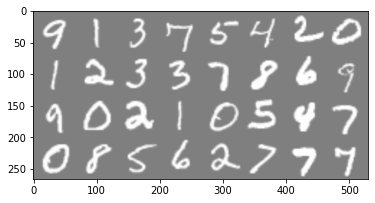

epoch [4/10]  batch 300/938\  loss D : 0.7875,   loss G: 1.5058    D(x): 0.7102


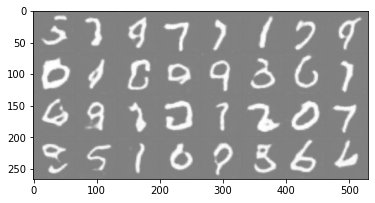

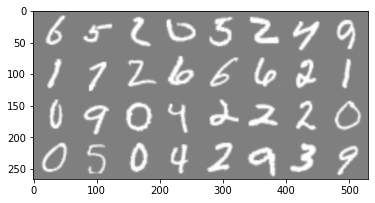

epoch [4/10]  batch 400/938\  loss D : 0.7871,   loss G: 1.8755    D(x): 0.7618


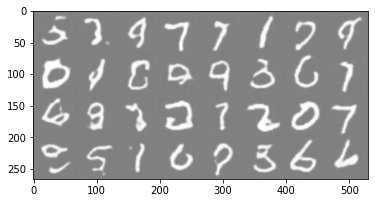

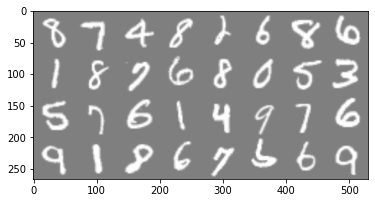

epoch [4/10]  batch 500/938\  loss D : 0.7889,   loss G: 1.6698    D(x): 0.7611


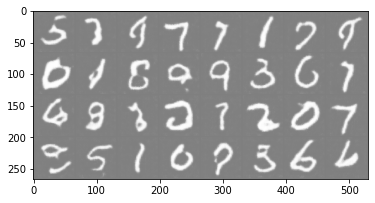

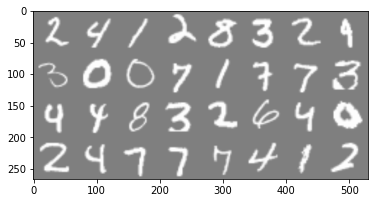

epoch [4/10]  batch 600/938\  loss D : 0.7307,   loss G: 1.6963    D(x): 0.8003


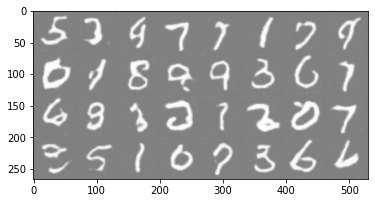

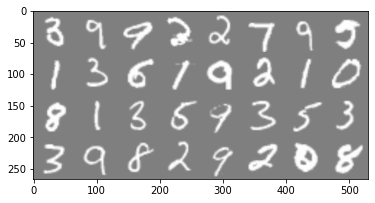

epoch [4/10]  batch 700/938\  loss D : 0.7827,   loss G: 1.4485    D(x): 0.7200


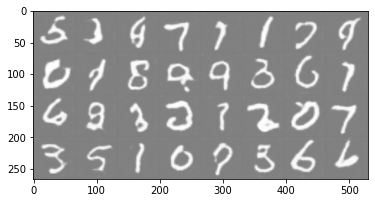

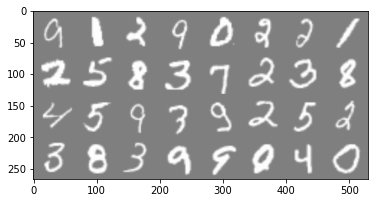

epoch [4/10]  batch 800/938\  loss D : 0.7143,   loss G: 1.7044    D(x): 0.8088


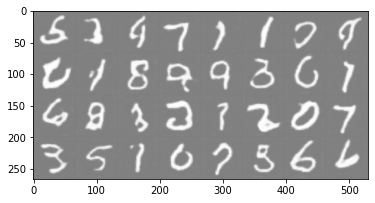

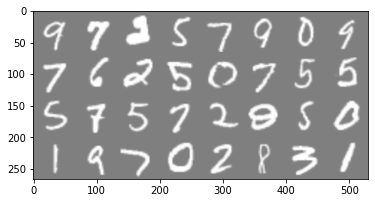

epoch [4/10]  batch 900/938\  loss D : 0.7577,   loss G: 1.6473    D(x): 0.7473


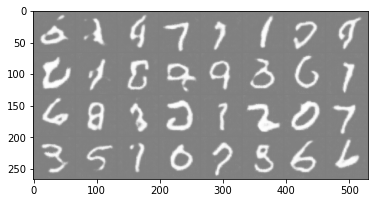

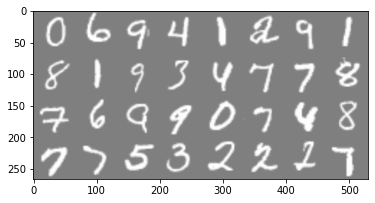

epoch [5/10]  batch 0/938\  loss D : 0.7082,   loss G: 2.3511    D(x): 0.8693


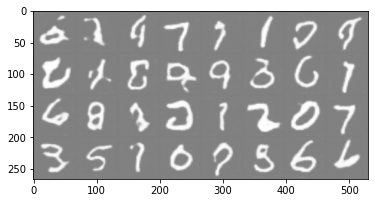

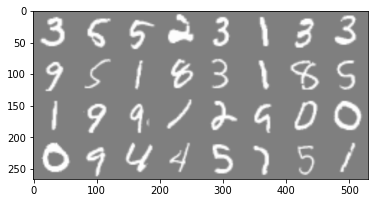

epoch [5/10]  batch 100/938\  loss D : 0.7778,   loss G: 2.2500    D(x): 0.8808


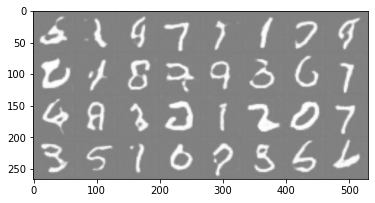

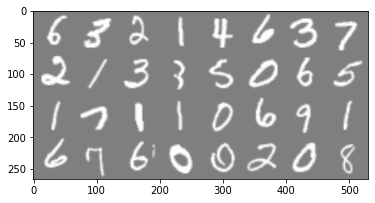

epoch [5/10]  batch 200/938\  loss D : 0.6867,   loss G: 2.1810    D(x): 0.8694


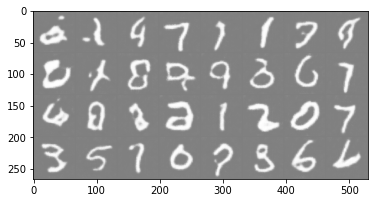

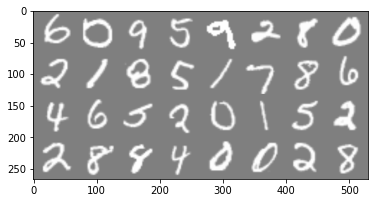

epoch [5/10]  batch 300/938\  loss D : 0.8290,   loss G: 1.7883    D(x): 0.6933


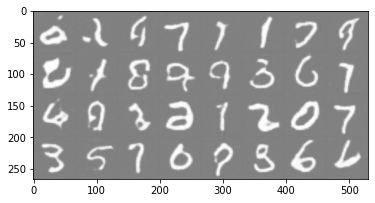

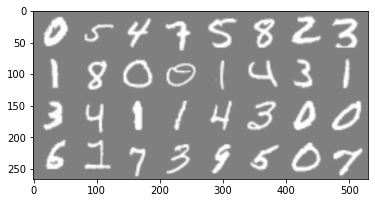

epoch [5/10]  batch 400/938\  loss D : 0.7451,   loss G: 2.1507    D(x): 0.8299


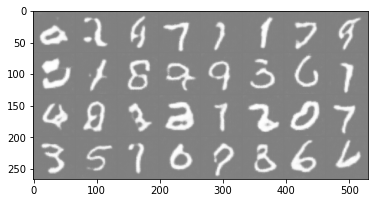

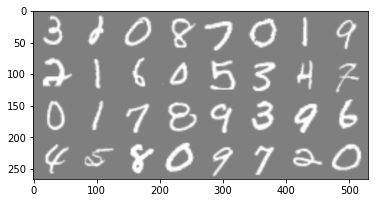

epoch [5/10]  batch 500/938\  loss D : 0.7280,   loss G: 1.6425    D(x): 0.7964


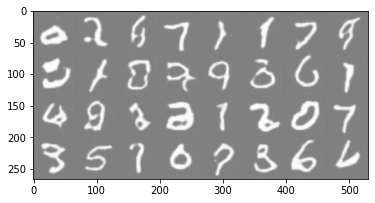

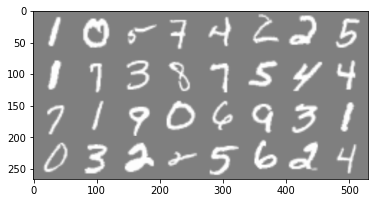

epoch [5/10]  batch 600/938\  loss D : 0.7367,   loss G: 2.7318    D(x): 0.9096


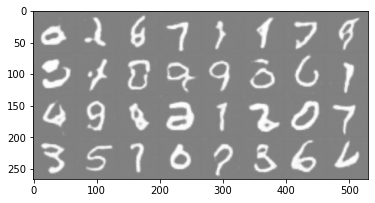

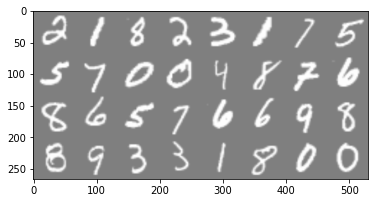

epoch [5/10]  batch 700/938\  loss D : 1.0683,   loss G: 1.7780    D(x): 0.5244


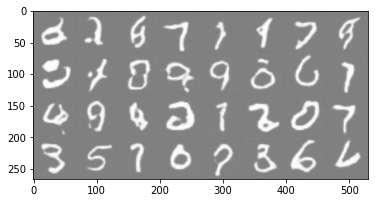

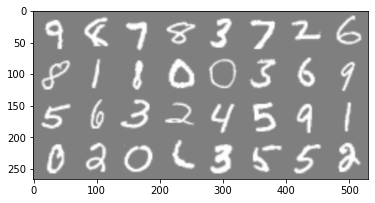

epoch [5/10]  batch 800/938\  loss D : 0.6930,   loss G: 2.1767    D(x): 0.8248


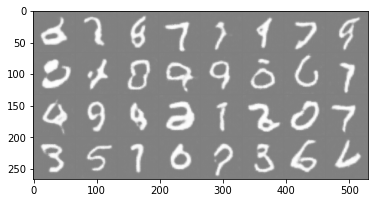

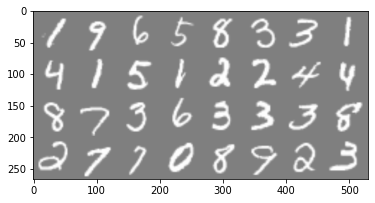

epoch [5/10]  batch 900/938\  loss D : 0.7647,   loss G: 1.4216    D(x): 0.7407


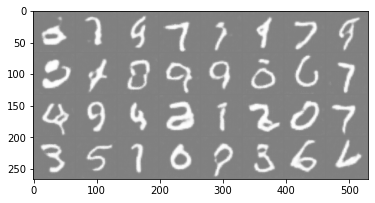

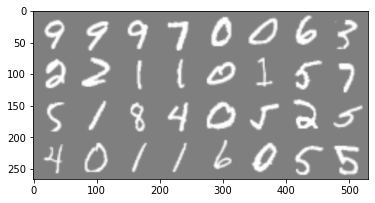

epoch [6/10]  batch 0/938\  loss D : 0.6758,   loss G: 2.3348    D(x): 0.8772


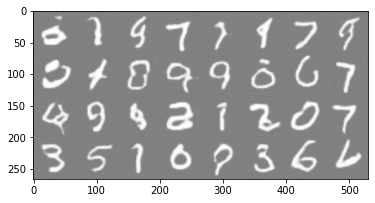

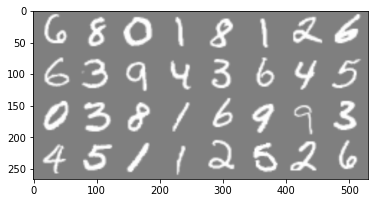

epoch [6/10]  batch 100/938\  loss D : 1.1465,   loss G: 2.8635    D(x): 0.9623


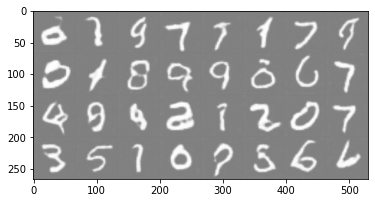

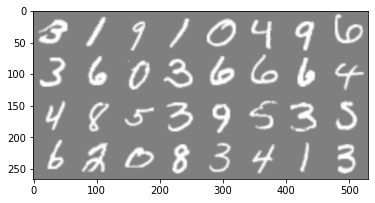

epoch [6/10]  batch 200/938\  loss D : 0.6833,   loss G: 2.0205    D(x): 0.8423


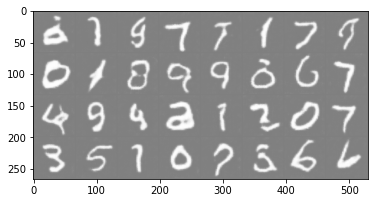

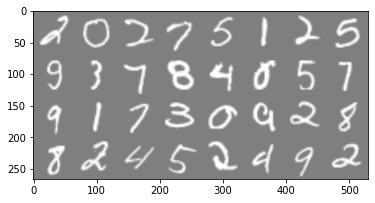

epoch [6/10]  batch 300/938\  loss D : 0.7239,   loss G: 2.2202    D(x): 0.8985


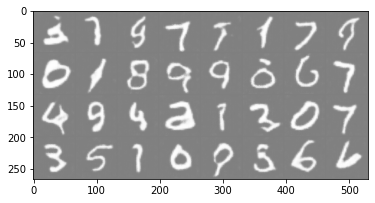

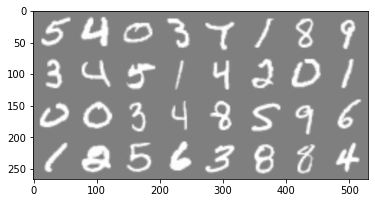

epoch [6/10]  batch 400/938\  loss D : 0.6944,   loss G: 2.2450    D(x): 0.8870


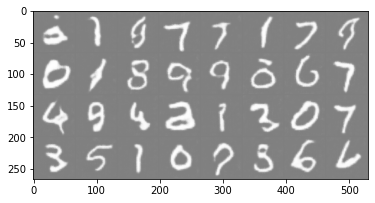

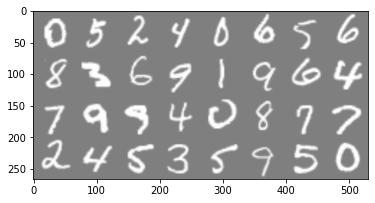

epoch [6/10]  batch 500/938\  loss D : 0.8435,   loss G: 2.8526    D(x): 0.9461


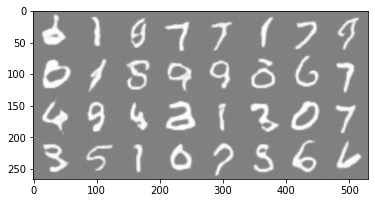

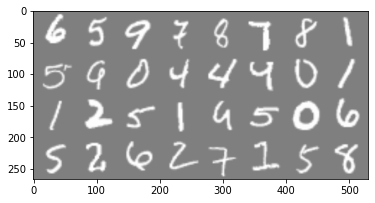

epoch [6/10]  batch 600/938\  loss D : 0.7051,   loss G: 2.4136    D(x): 0.8753


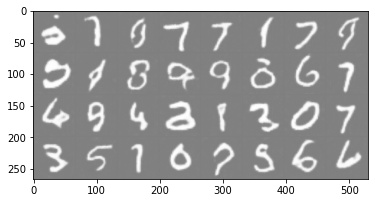

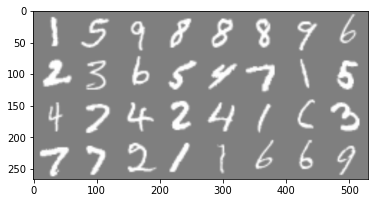

epoch [6/10]  batch 700/938\  loss D : 0.7089,   loss G: 1.7820    D(x): 0.8058


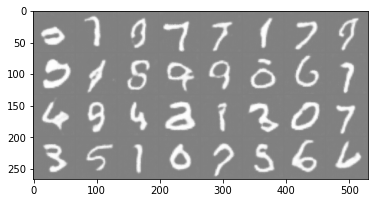

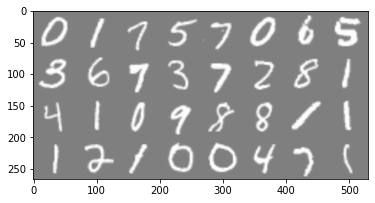

epoch [6/10]  batch 800/938\  loss D : 0.7280,   loss G: 1.6767    D(x): 0.7775


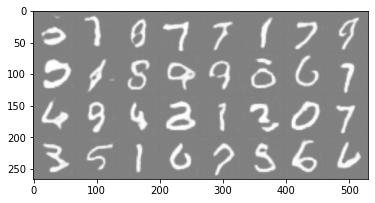

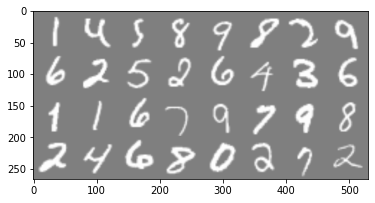

epoch [6/10]  batch 900/938\  loss D : 0.7420,   loss G: 1.7210    D(x): 0.7596


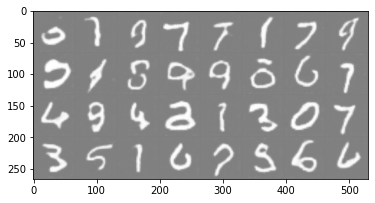

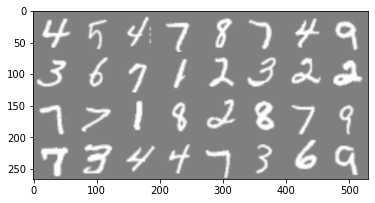

epoch [7/10]  batch 0/938\  loss D : 1.0989,   loss G: 1.9353    D(x): 0.8410


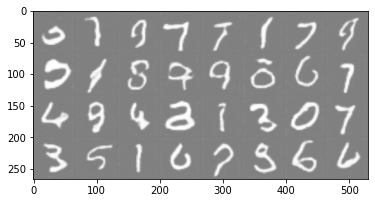

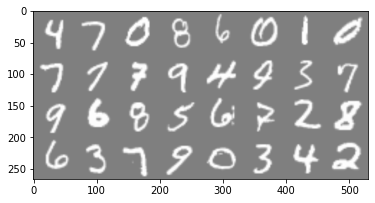

epoch [7/10]  batch 100/938\  loss D : 0.7506,   loss G: 2.1665    D(x): 0.8889


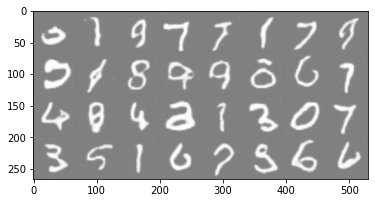

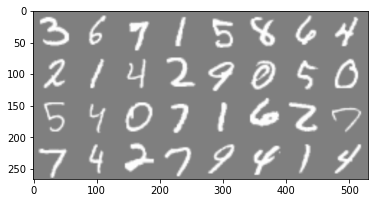

epoch [7/10]  batch 200/938\  loss D : 0.7315,   loss G: 2.8965    D(x): 0.8999


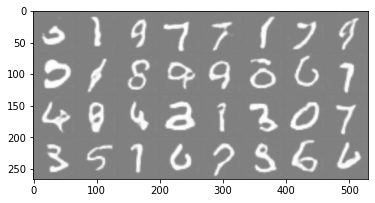

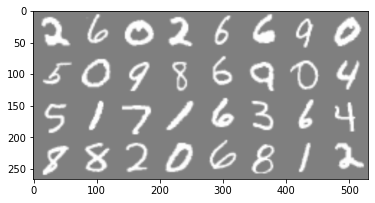

epoch [7/10]  batch 300/938\  loss D : 0.6669,   loss G: 2.1691    D(x): 0.8760


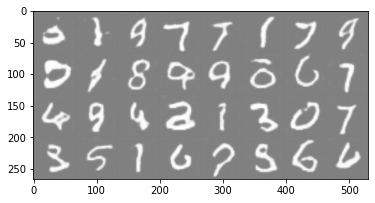

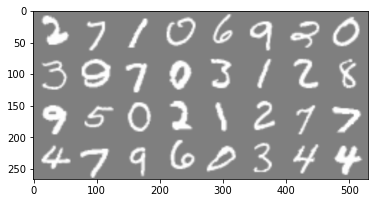

epoch [7/10]  batch 400/938\  loss D : 0.7017,   loss G: 1.9191    D(x): 0.8197


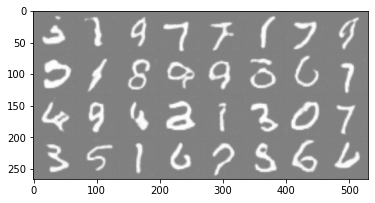

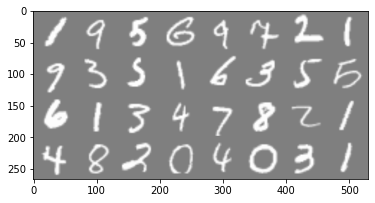

epoch [7/10]  batch 500/938\  loss D : 0.6973,   loss G: 2.5036    D(x): 0.9066


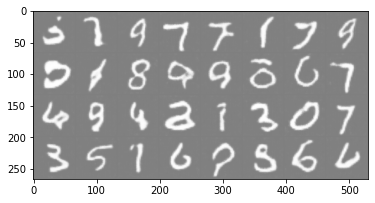

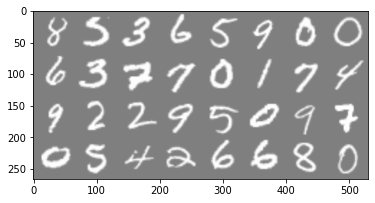

epoch [7/10]  batch 600/938\  loss D : 0.7468,   loss G: 2.9997    D(x): 0.9390


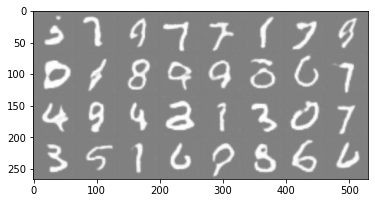

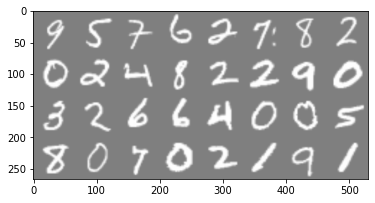

epoch [7/10]  batch 700/938\  loss D : 0.7189,   loss G: 2.0798    D(x): 0.7895


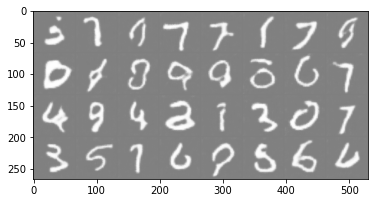

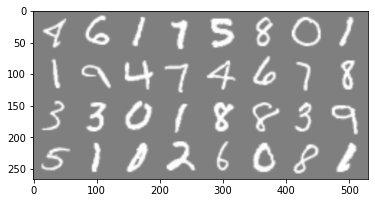

epoch [7/10]  batch 800/938\  loss D : 0.6880,   loss G: 1.8889    D(x): 0.8356


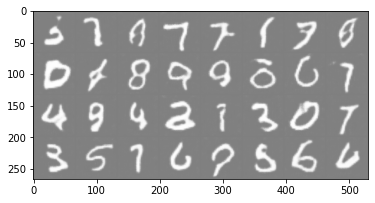

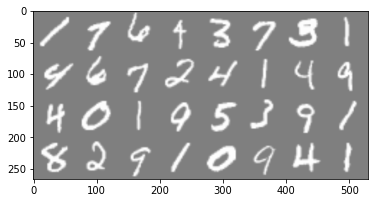

epoch [7/10]  batch 900/938\  loss D : 1.1551,   loss G: 2.5498    D(x): 0.8624


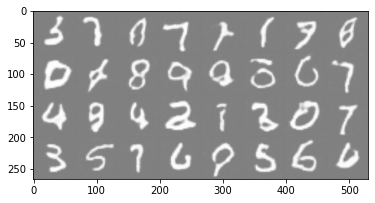

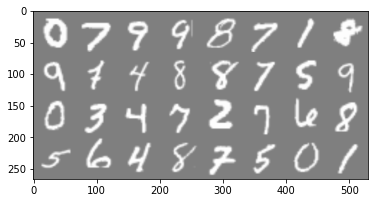

epoch [8/10]  batch 0/938\  loss D : 0.6989,   loss G: 2.1034    D(x): 0.8317


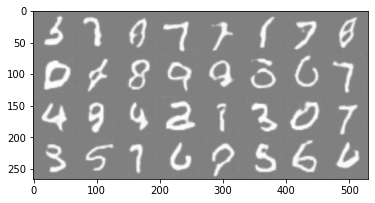

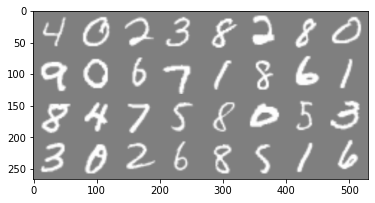

epoch [8/10]  batch 100/938\  loss D : 0.6808,   loss G: 2.2837    D(x): 0.8894


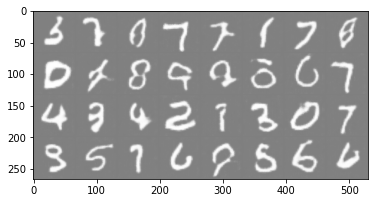

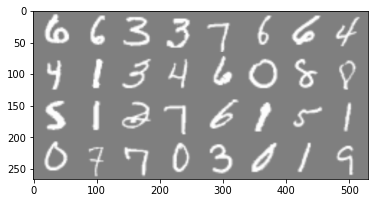

epoch [8/10]  batch 200/938\  loss D : 0.7201,   loss G: 2.5813    D(x): 0.9123


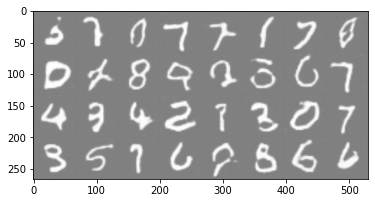

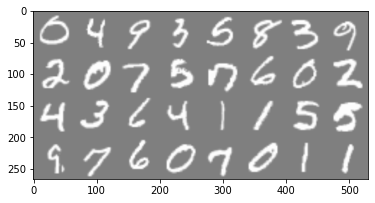

epoch [8/10]  batch 300/938\  loss D : 0.6782,   loss G: 2.1572    D(x): 0.9248


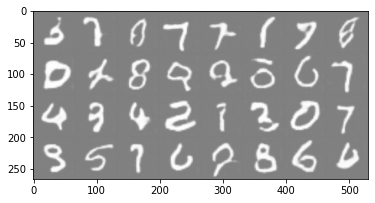

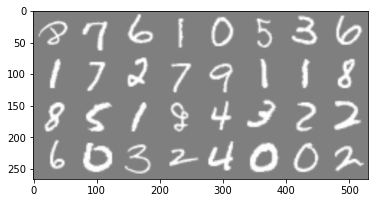

epoch [8/10]  batch 400/938\  loss D : 0.7651,   loss G: 3.1356    D(x): 0.9396


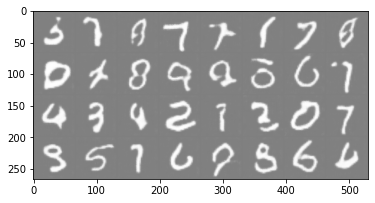

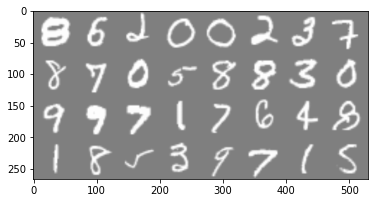

epoch [8/10]  batch 500/938\  loss D : 0.6880,   loss G: 1.9009    D(x): 0.8338


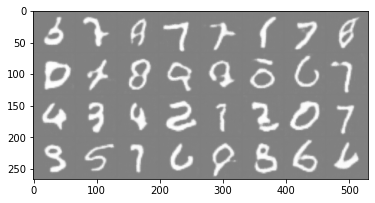

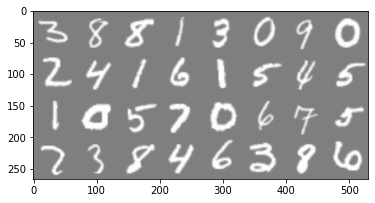

epoch [8/10]  batch 600/938\  loss D : 1.4964,   loss G: 0.1981    D(x): 0.3181


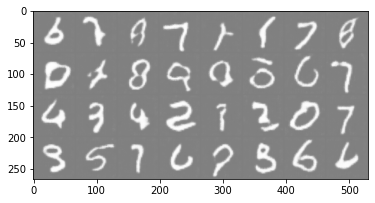

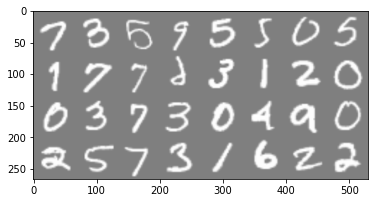

epoch [8/10]  batch 700/938\  loss D : 0.7178,   loss G: 2.3174    D(x): 0.8038


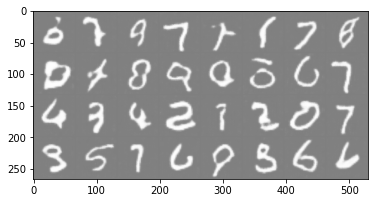

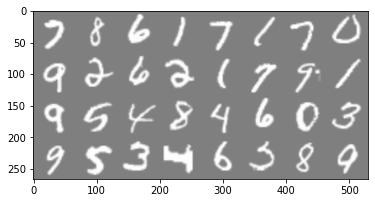

epoch [8/10]  batch 800/938\  loss D : 0.6915,   loss G: 2.0048    D(x): 0.8699


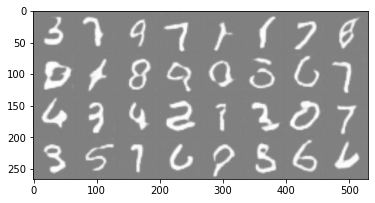

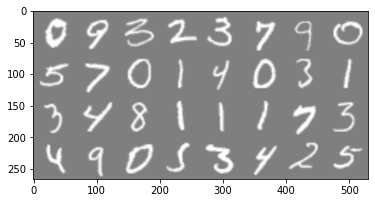

epoch [8/10]  batch 900/938\  loss D : 0.6766,   loss G: 2.0942    D(x): 0.8496


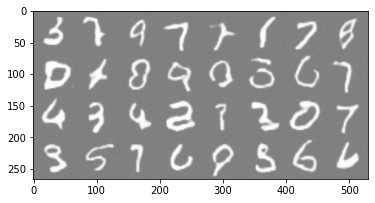

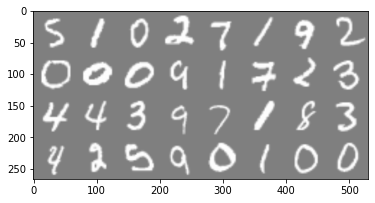

epoch [9/10]  batch 0/938\  loss D : 0.7130,   loss G: 2.8512    D(x): 0.9453


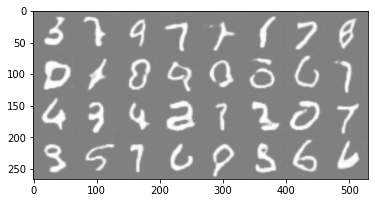

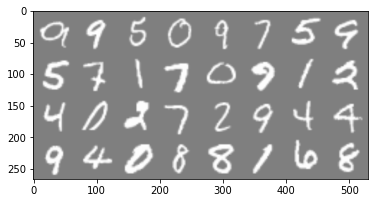

epoch [9/10]  batch 100/938\  loss D : 0.7887,   loss G: 2.3662    D(x): 0.9184


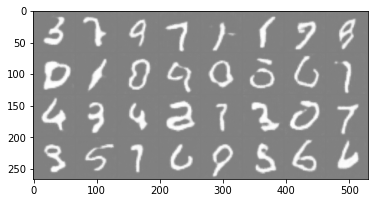

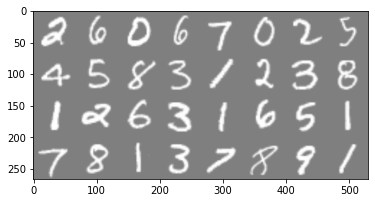

epoch [9/10]  batch 200/938\  loss D : 0.8006,   loss G: 2.0462    D(x): 0.7274


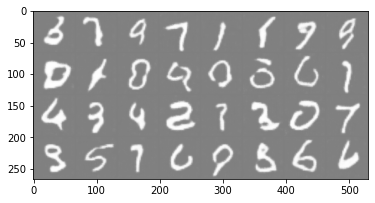

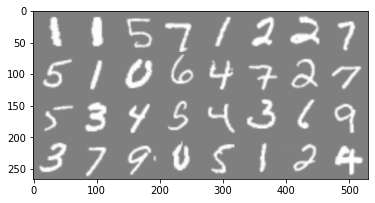

epoch [9/10]  batch 300/938\  loss D : 1.0751,   loss G: 1.5183    D(x): 0.7816


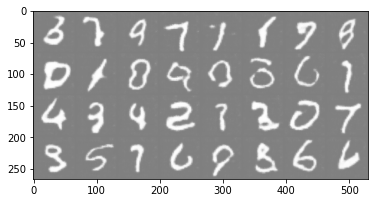

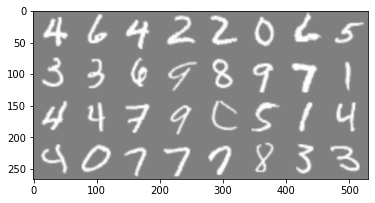

epoch [9/10]  batch 400/938\  loss D : 0.7000,   loss G: 1.8793    D(x): 0.8409


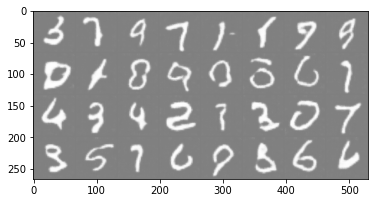

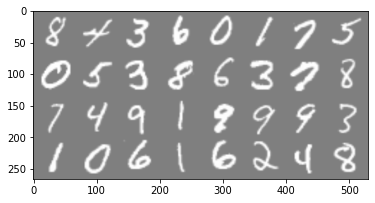

epoch [9/10]  batch 500/938\  loss D : 0.7250,   loss G: 2.2420    D(x): 0.8638


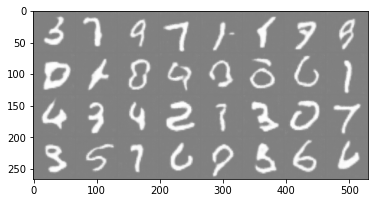

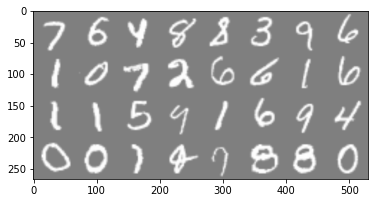

epoch [9/10]  batch 600/938\  loss D : 0.6879,   loss G: 2.3027    D(x): 0.8758


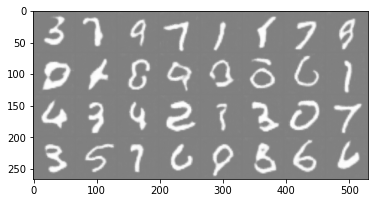

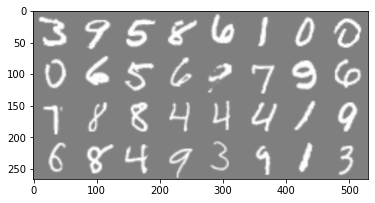

epoch [9/10]  batch 700/938\  loss D : 0.6865,   loss G: 2.6558    D(x): 0.8873


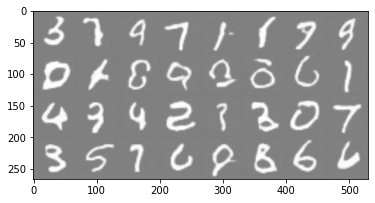

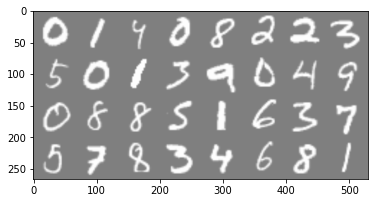

epoch [9/10]  batch 800/938\  loss D : 0.6888,   loss G: 2.3203    D(x): 0.8571


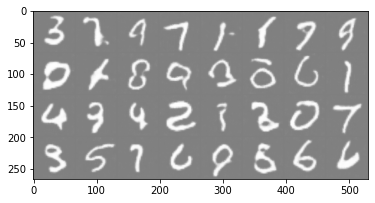

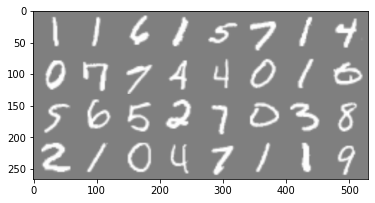

epoch [9/10]  batch 900/938\  loss D : 0.6846,   loss G: 2.3402    D(x): 0.8463


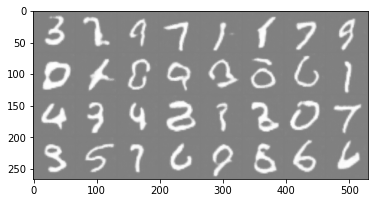

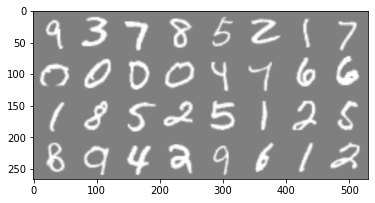

In [6]:
lr=0.0002
batch_size=64
image_size=64
channels_img=1
channel_noise=256
num_epochs=10

features_d=16
features_g=16
# print(features_g*8)
my_transform=transforms.Compose([
  transforms.Resize(image_size),
  transforms.ToTensor(),
  transforms.Normalize((0.5,),(0.5,)),
  ])

dataset=datasets.MNIST(root='dataset/',train=True,transform=my_transform,download=True)
# print(dataset)
dataloader=DataLoader(dataset,batch_size=batch_size,shuffle=True)

device=torch.device("cuda" if torch.cuda.is_available() else "cpu")

netD=Discriminator(channels_img,features_d).to(device)
netG=Generator(channel_noise,channels_img,features_g).to(device)

optimizerD=optim.Adam(netD.parameters(),lr=lr,betas=(0.5,0.999))
optimizerG=optim.Adam(netG.parameters(),lr=lr,betas=(0.5,0.999))

netG.train()
netD.train()

criterion=nn.BCELoss()

real_label=1
fake_label=0

fixed_noise=torch.randn(64,channel_noise,1,1).to(device)
writer_real=SummaryWriter(f'runs/DCGAN_MNIST/test_real')
writer_fake=SummaryWriter(f'runs/DCGAN_MNIST/test_fake')
step=0

print("Training")

for epoch in range(num_epochs):
  for batch_idx,(data,targets) in enumerate(dataloader):
    # print(data.shape,targets)
    data=data.to(device)
    batch_size=data.shape[0]

    netD.zero_grad()
    label=(torch.ones(batch_size)*0.9).to(device)
    output=netD(data).reshape(-1)
    lossD_real=criterion(output,label)
    D_x=output.mean().item()

    noise=torch.randn(batch_size,channel_noise,1,1).to(device)
    fake=netG(noise)
    label=(torch.ones(batch_size)*0.1).to(device)

    output=netD(fake.detach()).reshape(-1)
    lossD_fake=criterion(output,label)

    lossD=lossD_real+lossD_fake
    lossD.backward()
    optimizerD.step()

    netG.zero_grad()
    label=torch.ones(batch_size).to(device)
    output=netD(fake).reshape(-1)
    lossG=criterion(output,label)
    lossG.backward()
    optimizerG.step()

    if batch_idx%100==0:
      step+=1
      print(f'epoch [{epoch}/{num_epochs}]  batch {batch_idx}/{len(dataloader)}\  loss D : {lossD:.4f},   loss G: {lossG:.4f}    D(x): {D_x:.4f}')
      with torch.no_grad():
         fake=netG(fixed_noise)

         image_grid_real=torchvision.utils.make_grid(data[:32],normalize=True)
         image_grid_fake=torchvision.utils.make_grid(fake[:32],normalize=True)
         imshow(image_grid_fake)
         imshow(image_grid_real)
         writer_real.add_image("mnist  real images",image_grid_real,global_step=step)
         writer_fake.add_image("mnsit fake images",image_grid_fake,global_step=step)
